Random things implementing Matmul on reals vs quantized version of the reals

(array([[  1.507,  -4.729,   0.129,  -6.128,  -1.3  ,   2.478,   1.885,
           6.684,   4.343,  -6.165],
        [-10.471,  -0.589,  -0.788,  -1.557,   4.175,  -0.938,   2.202,
          -2.382,  -1.686,  -0.394],
        [ -6.269,   0.463,   1.646,  -1.28 ,   4.947,  -0.338,   2.163,
          -1.098,  -2.511,   1.514],
        [ -2.053,   0.34 ,  -1.726,   9.307,  -5.481,   1.605,   0.128,
           2.515,   5.242,   0.693],
        [  2.448,   0.915,   2.503,   0.59 ,   2.161,  -3.814,   0.75 ,
           1.728,   3.769,  -1.666],
        [ -5.581,  -3.161,  -1.649,  -3.781,   7.769,   0.472,   0.929,
           1.322,  -3.447,  -5.157],
        [ -2.123,  -0.585,  -2.947,  -7.155,   6.639,   9.162,  -3.381,
          -1.645,   2.145,  -1.539],
        [ -0.971,   1.273,  -2.834,  -3.323,   6.096,  -2.027,   2.883,
           4.242,   1.282,  -4.009]]),
 array([[ 1.971, -2.92 , -1.533, -4.672,  0.   , -0.292,  0.292,  4.234,
          2.409, -7.154],
        [-8.395, -0.949, -0

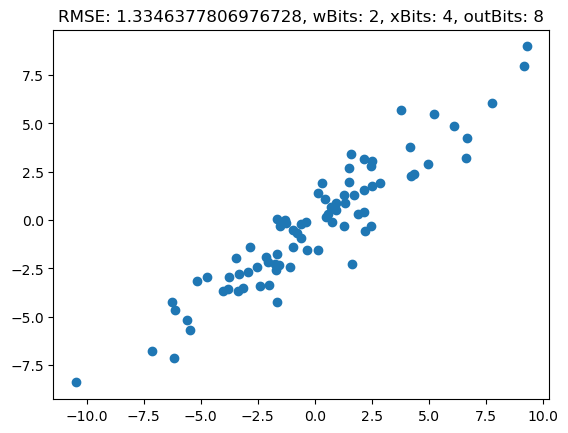

In [1]:
import numpy as np 
import hwacc_design_garage.quantization.quant as quant
import plotly.express as px

wDimX = 8
wDimY = 128
xBatches = 10
wBits = 2
xBits = 4
seed = 0
outBits = 8
# np.random.seed(seed)

wShape = (wDimX, wDimY)
xShape = (xBatches, wDimY)

w = np.random.uniform(-1, 1, wShape)
x = np.random.uniform(-1, 1, xShape)
wx = w @ x.T

# Calculate the output scale
wx_qtensor = quant.quantized_tensor(
    real_values=wx,
    precision=outBits,
    mode='maxmin'
)

# Set numpy printing to at most 3 significant digits
np.set_printoptions(precision=3)

# print('w\n',w)
# print('x\n',x)
# print('wx\n',wx)

# Quantize the weights and input
wQ = quant.quantized_tensor(
    real_values=w,
    precision=wBits,
    mode='maxmin',
    zero_point = 0
)
xQ = quant.quantized_tensor(
    real_values=x,
    precision=xBits,
    mode='maxmin',
    zero_point = 0
)
wQxQ_qvals_t = wQ.quantized_values @ xQ.quantized_values.T

out_scale = wx_qtensor.scale

wQxQ_t = quant.quantized_tensor(
    quantized_values=wQxQ_qvals_t,
    scale=out_scale,
    zero_point = 0
)

wQxQ = quant.scaling_quantized_matmul(
    wQ, xQ, outBits, internalPrecision=16, out_scale = out_scale
)

import matplotlib.pyplot as plt

plt.scatter(wx.flatten(), wQxQ.fake_quantized_values.flatten())
rmse = np.sqrt(np.mean((wx - wQxQ.fake_quantized_values)**2))
plt.title(f'RMSE: {rmse}, wBits: {wBits}, xBits: {xBits}, outBits: {outBits}')

wx, wQxQ.fake_quantized_values, wQxQ.quantized_values

In [2]:
wBits = 2
w = np.random.uniform(-1, 1, wShape)
wQ = quant.quantized_tensor(
    real_values=w,
    precision=wBits, 
    mode='maxmin',
    zero_point = 0
)

wQ.quantized_values, wQ.real_values

(array([[ 0,  0,  1, ...,  1,  1,  1],
        [ 0, -1,  1, ..., -1,  0,  0],
        [ 0, -1,  1, ...,  0, -1, -1],
        ...,
        [ 1,  1,  1, ...,  1, -1,  1],
        [ 1,  0,  1, ..., -1,  1, -1],
        [-1,  0,  1, ...,  1, -1,  1]]),
 array([[ 0.048, -0.304,  0.928, ...,  0.451,  0.553,  0.581],
        [ 0.126, -0.971,  0.517, ..., -0.985, -0.33 , -0.252],
        [ 0.03 , -0.818,  0.405, ..., -0.219, -0.561, -0.707],
        ...,
        [ 0.654,  0.407,  0.917, ...,  0.868, -0.702,  0.594],
        [ 0.656, -0.035,  0.411, ..., -0.94 ,  0.875, -0.956],
        [-0.891, -0.245,  0.36 , ...,  0.937, -0.932,  0.669]]))

Testing generate for qrAcc

In [3]:
import numpy as np

wDimX = 8
wDimY = 128
xBatches = 50
weight_mode = 'bipolar'

xTrits = 4
seed = 0
outBits = 4

wShape = (wDimX, wDimY)
xShape = (xBatches, wDimY)

if weight_mode=='binary':
    w = np.random.randint(0,2, wShape) # Binary Weights
    x = np.random.randint(-(2**(xTrits)), 2**(xTrits),xShape)
elif weight_mode=='bipolar':
    w = np.random.randint(0,2, wShape)*2-1 # Bipolar Weights
    x = np.random.randint(-(2**(xTrits)), 2**(xTrits),xShape)
wx = w @ x.T

wxBits = quant.get_array_bits(wx)
wx_outBits = quant.saturating_clip(wx, inBits = wxBits, outBits = outBits)

# Plotly scatter with fit line, square figure
px.scatter(
    x=wx.flatten(),
    y=wx_outBits.flatten(), 
    trendline='ols',
    title=f'RMSE: {np.sqrt(np.mean((wx - wx_outBits)**2))}, wxBits: {wxBits}, outBits: {outBits}',
    labels={'x':'wx', 'y':'wx_outBits'},
    width=600,
    height=600
)

In [ ]:
aBits = 10
a = np.random.randint(-(2**(aBits-1)), (2**(aBits-1))-1, (100,50))
a_sclip = quant.saturating_clip(a, inBits = aBits, outBits = 4)

px.scatter(
    x=a.flatten(),
    y=a_sclip.flatten(), 
    trendline='ols',
    title=f'RMSE: {np.sqrt(np.mean((wx - wx_outBits)**2))}',
    labels={'x':'a', 'y':'a_sclip'},
    width=600,
    height=600
)


In [28]:
wbin = (w+1)//2 # Back to binary
quant.binary_array_to_int(wbin)

array([108,  55,  33, 131, 129,  15,  28, 237, 178, 234, 243,  22,  20,
       185,  38, 166, 154,  45, 149, 167,  35, 186,   0,  30,  46, 178,
        33, 218,  24, 161, 166, 114, 246, 185,  21,  48, 169,  51,  83,
        83, 143,  87, 147, 231, 194,  80,  69, 163,  15, 177, 255, 178,
       133,  88, 144, 164, 167, 205,  31, 166, 245,  44, 106, 139,  49,
       189,   9, 123,  66, 239,  40, 207, 234, 179,   5,  62, 235,  52,
        63,  52,  34,  24, 233, 246,  40, 133, 215, 220, 233, 211,  58,
       249,  42,  58, 183, 172,  89, 204, 101,  44, 198,  67,  48, 155,
        29,  79,  63, 121, 241,  53,  39,   7, 219,  21,  95, 186, 106,
        43, 252, 178, 191, 208,  53,   5, 189, 220, 142,  45])

In [32]:
x[0]

array([  6,  15, -14, -12,  -6, -14,   5, -13,   7,   7,   1,   1,  14,
         5,  10,  -9,  -7,  -8,   9,   7,  -2,   5,   2,   9,  15,  14,
       -13,  13,  -7,   8,  12,   6,  -5, -15,  10,  14,  12, -11, -15,
       -13,  -9, -15, -11, -13,   9,  -1,   7,  -6,  -6,   3,   4,  -3,
        15,  11,  -7,  15,   1,  -1,  -3, -15,   5,   7,   6,   9, -15,
        -4,  -5,  -7,  -3,   8,  -1,  15,  11, -15,   2,   9,  -3, -10,
        -6,  12,   1,  15,  -4,   2,  -7,  11,  12, -16,  14,  -6, -15,
       -12,  -4,  -9,  12, -14,  14,  11,  -7, -16,  -5,   4,  10,  -8,
        -7,  -9,   3,   7,  -6,  -1,   3,   3,   0,   6, -16,  13,  -4,
        15, -14,  -1, -14,   9,  -6,  15,   2,  13, -11,  -6])

### What does two uniforms multiplied turn into?

Answer: 

The matmul turns gaussian regardless of input range

The elementwise product turns into an exponential distribution with bias toward zero

In [6]:
a = np.random.uniform(0, 2, (250, 250))
b = np.random.uniform(0, 2, (250, 250))
c = a @ b
d = a * b


In [7]:
px.histogram(x=c.flatten(), title='Matmul')

In [8]:
px.histogram(x=d.flatten(), title='Hadamard Product', nbins=300)